In [ ]:
# Connect google drive to google colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
main_datasets_path = '/content/drive/MyDrive/AVD/Trabajos_3_4/Datasets/'

In [ ]:
!pip install lime
!pip install shap
!pip install yellowbrick
!python -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 988.1 kB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


# Clasificación de las descripciones de las películas para predecir el género

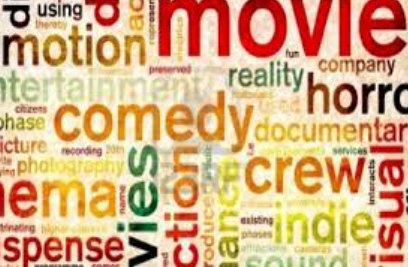

# Entendimiento del problema

Las películas son un medio de entretenimiento popular en todo el mundo. Con muchos servicios de streaming y sitios web disponibles y aún más en el horizonte, construir un modelo predictivo que genere automáticamente el género de una película basado en su resumen de trama es definitivamente beneficioso, ya que puede reducir el gasto de etiquetar manualmente las películas.

# Entendimiento de los datos

El conjunto de datos utilizado en este cuaderno se obtuvo de Kaggle y contiene resúmenes de tramas de películas raspados de Wikipedia. El conjunto de datos tiene 34,886 entradas. La información encontrada en el conjunto de datos es la siguiente:

1. Release Year - año de estreno
2. Title - título de las películas
3. Origin/Ethnicity - país de origen de las películas
4. Director - nombres de los directores asociados con las películas
5. Cast - nombre del elenco asociado con las películas
6. Wiki Page - página de Wikipedia de las películas
7. Plot - resumen de la trama de las películas

# Análisis exploratorio de los datos

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import csv
import seaborn as sns
%matplotlib inline

In [ ]:
wiki= pd.read_csv(main_datasets_path+'wiki_movie_plots_deduped.csv')

wiki.head()

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot
0,1901,Kansas Saloon Smashers,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"A bartender is working at a saloon, serving dr..."
1,1901,Love by the Light of the Moon,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"The moon, painted with a smiling face hangs ov..."
2,1901,The Martyred Presidents,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/The_Martyred_Pre...,"The film, just over a minute long, is composed..."
3,1901,"Terrible Teddy, the Grizzly King",American,Unknown,NaN,unknown,"https://en.wikipedia.org/wiki/Terrible_Teddy,_...",Lasting just 61 seconds and consisting of two ...
4,1902,Jack and the Beanstalk,American,"George S. Fleming, Edwin S. Porter",NaN,unknown,https://en.wikipedia.org/wiki/Jack_and_the_Bea...,The earliest known adaptation of the classic f...


## Subdividiendo el conjunto de datos para incluir solo las entradas con un género conocido y reiniciando el índice.

In [ ]:
wiki_df = wiki.loc[wiki['Genre']!='unknown']
wiki_df.reset_index(drop = True, inplace = True)


Verificando el número de valores únicos que tenemos en la columna de géneros.

In [ ]:
genres=pd.value_counts(wiki_df.Genre)

print('There are ',len(genres), 'different Genres in the dataset:')
print('-'*50)
print(genres)

There are  2264 different Genres in the dataset:
--------------------------------------------------
Genre
drama                                                              5964
comedy                                                             4379
horror                                                             1167
action                                                             1098
thriller                                                            966
                                                                   ... 
drama, sports (road bicycle racing), comedy-drama                     1
fantasy, sci-fi, action, mecha, supernatural                          1
drama, slice of life, sports (aquatics, swimming), comedy-drama       1
drama, children's, comedy-drama, youth, romance, slice of life        1
drama, romance, youth, mystery                                        1
Name: count, Length: 2264, dtype: int64


## Obteniendo los 6 géneros más comunes en el conjunto de datos.

In [ ]:
top_genres = pd.DataFrame(genres[:6]).reset_index()
top_genres.columns = ['genres', 'number_of_movies']
top_genres

,genres,number_of_movies
0,drama,5964
1,comedy,4379
2,horror,1167
3,action,1098
4,thriller,966
5,romance,923


## Distribución de películas de los seis géneros principales en el conjunto de datos.

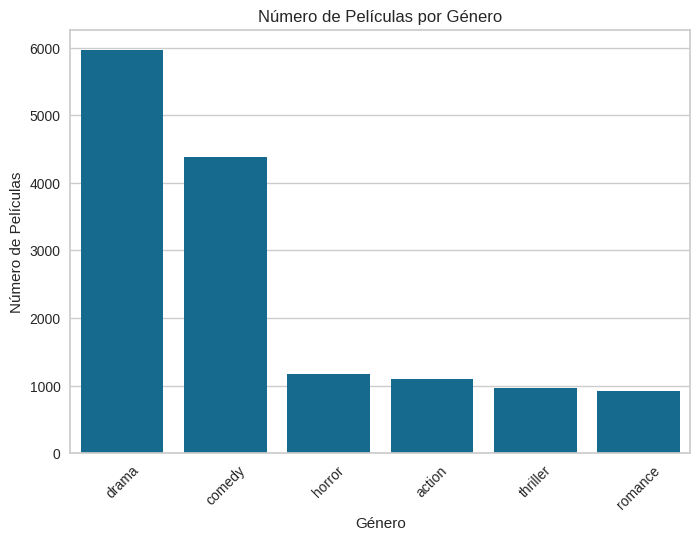

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que 'top_genres' es tu DataFrame y contiene dos columnas: 'genres' y 'number_of_movies'
# 'genres' contiene los nombres de los géneros y 'number_of_movies' el conteo de películas por género

# Crear el gráfico de barras
sns.barplot(x='genres', y='number_of_movies', data=top_genres)

# Mejorar la legibilidad rotando las etiquetas del eje X
plt.xticks(rotation=45)

# Añadir títulos y etiquetas para claridad
plt.title('Número de Películas por Género')
plt.xlabel('Género')
plt.ylabel('Número de Películas')

# Mostrar el gráfico
plt.show()

## Creando una columna de etiquetas separada solo para los 6 géneros principales y asignando los valores entre 1 y 6 para drama, comedia, horror, acción, thriller y romance, respectivamente, si están presentes en la columna de género de la película (para entradas que tienen solo un género).

In [ ]:
conditions = [wiki_df['Genre']=='drama', wiki_df['Genre']=='comedy', wiki_df['Genre']=='horror', wiki_df['Genre']=='action', wiki_df['Genre']=='thriller',
             wiki_df['Genre']=='romance']
choices = [1,2,3,4,5,6]
wiki_df['labels'] = np.select(conditions, choices, 0)

<ipython-input-82-cb6047d24fa3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wiki_df['labels'] = np.select(conditions, choices, 0)


In [ ]:
wiki_df.sample(3)

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot,labels
2896,1940,Too Many Girls,American,George Abbott,"Lucille Ball, Frances Langford, Desi Arnaz",musical,https://en.wikipedia.org/wiki/Too_Many_Girls_(...,"Mr Casey's daughter, Connie, wants to go to Po...",0
18301,1948,The Winslow Boy,British,Anthony Asquith,"Robert Donat, Margaret Leighton, Cedric Hardwicke",drama,https://en.wikipedia.org/wiki/The_Winslow_Boy_...,"Ronnie Winslow (Neil North), a cadet at the Ro...",1
25020,2017,Fukrey Returns,Bollywood,Mrighdeep Singh Lamba,"Pulkit Samrat, Priya Anand & Varun Sharma",comedy,https://en.wikipedia.org/wiki/Fukrey_Returns,"After their admission in college, Hunny, Chooc...",2


In [ ]:
wiki_df['labels'].value_counts()

labels
0    14306
1     5964
2     4379
3     1167
4     1098
5      966
6      923
Name: count, dtype: int64

## Subdividiendo el dataframe wiki_df para incluir solo las filas que tienen entradas (1-6) en las columnas de etiquetas recién creadas (las que tienen solo una entrada de género único).

In [ ]:
df_to_use = (wiki_df.loc[wiki_df['labels']!=0]).reset_index(drop = True)

In [ ]:
# We are now left with about 14 thousand rows of data
df_to_use.head()

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot,labels
0,1904,The Suburbanite,American,Wallace McCutcheon,NaN,comedy,https://en.wikipedia.org/wiki/The_Suburbanite,The film is about a family who move to the sub...,2
1,1907,How Brown Saw the Baseball Game,American,Unknown,Unknown,comedy,https://en.wikipedia.org/wiki/How_Brown_Saw_th...,Before heading out to a baseball game at a nea...,2
2,1907,Laughing Gas,American,Edwin Stanton Porter,"Bertha Regustus, Edward Boulden",comedy,https://en.wikipedia.org/wiki/Laughing_Gas_(fi...,The plot is that of a black woman going to the...,2
3,1908,The Adventures of Dollie,American,D. W. Griffith,"Arthur V. Johnson, Linda Arvidson",drama,https://en.wikipedia.org/wiki/The_Adventures_o...,On a beautiful summer day a father and mother ...,1
4,1908,The Black Viper,American,D. W. Griffith,D. W. Griffith,drama,https://en.wikipedia.org/wiki/The_Black_Viper,A thug accosts a girl as she leaves her workpl...,1


## Tabla mostrando las asignaciones de etiquetas de género

In [ ]:
assigned_label = pd.DataFrame(sorted(list(zip(df_to_use['Genre'].unique(), df_to_use['labels'].unique())), key = lambda x : x[1], reverse = False), columns = ['genres', 'labels'])
pd.merge(assigned_label, top_genres)

,genres,labels,number_of_movies
0,drama,1,5964
1,comedy,2,4379
2,horror,3,1167
3,action,4,1098
4,thriller,5,966
5,romance,6,923


Text(0, 0.5, 'Frequency of Occurence')

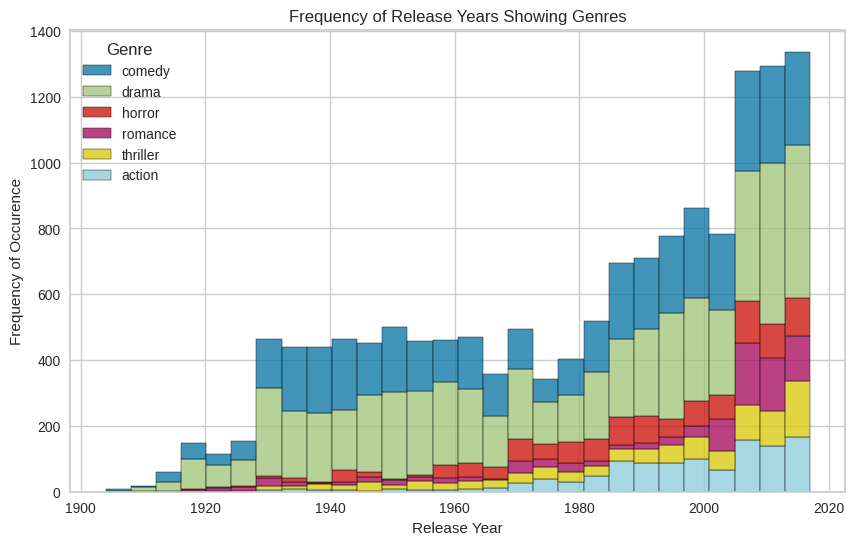

In [ ]:
# df_to_use.groupby(['Release Year', 'Genre']).agg('count')
fig, ax = plt.subplots(figsize=(10,6))

sns.histplot(x = 'Release Year', hue = 'Genre', data = df_to_use, multiple = 'stack')
plt.title('Frequency of Release Years Showing Genres')
plt.xlabel('Release Year')
plt.ylabel('Frequency of Occurence')

## Eliminando columnas innecesarias

In [ ]:
df_to_use.drop(columns = ['Release Year', 'Origin/Ethnicity', 'Director', 'Cast', 'Wiki Page'], axis = 1, inplace = True)

In [ ]:
df_to_use.head(2)

,Title,Genre,Plot,labels
0,The Suburbanite,comedy,The film is about a family who move to the sub...,2
1,How Brown Saw the Baseball Game,comedy,Before heading out to a baseball game at a nea...,2


In [ ]:
df_to_use.describe()

,labels
count,14497.000000
mean,2.275160
std,1.528956
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,6.000000


## Limpieza de la columna 'Trama' para el análisis

A continuación, estamos viendo una muestra del resumen de la trama

In [ ]:
df_to_use['Plot'][5]

"A young couple decides to elope after being caught in the midst of a romantic moment by the woman's angry father. They make plans to leave, but a thief discovers their plans and hides in their trunk and waits for the right moment to steal their belongings."

### Número total de palabras en los resúmenes de trama

In [ ]:
def word_length(text):
    num_of_words = 0
    for row in text:
        words = [word for word in row.split(' ')]
        num_of_words += len(words)
    return num_of_words

raw_length = word_length(df_to_use['Plot'])

In [ ]:
raw_length

5240143

### Número total de palabras ÚNICAS en los resúmenes de trama

In [ ]:
def unique_word_length(text):
    unique_words = set()
    for row in text:
        words = [word for word in row.split(' ')]
        unique_words.update(words)
    return len(unique_words)

raw_unique_length = unique_word_length(df_to_use['Plot'])

In [ ]:
raw_unique_length

253147

### Creando nuestra lista de palabras vacías y añadiendo algunas palabras más que son muy comunes en los resúmenes. Cambiando el texto a minúsculas, eliminación de palabras vacías, lematización.

In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
import string
import re
from nltk import word_tokenize
import spacy
nlp = spacy.load('en_core_web_lg')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


In [ ]:
stopwords_list = stopwords.words('english')
stopwords_list += list(string.punctuation)
stopwords_list += ['one', 'two', 'go','goes', 'get', 'also', 'however', 'tells']
stopwords_list += [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

def clean_text(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r"\'scuse", " excuse ", text)
    text = re.sub('\W', ' ', text)
    text = re.sub('\s+', ' ', text)
    text = re.sub('\d+', ' ', text)
    text = text.strip(' ')
    text = word_tokenize(text)
    text = ' '.join(text)
    text = nlp(text)
    text = [w.lemma_ for w in text]
    text = [w for w in text if w not in stopwords_list]
    text = ' '.join(text)
    return text

Revisando de nuevo el resumen que miramos anteriormente para ver si nuestra función funcionó

In [ ]:
# This will take lot of time, preprocessed df provided
#new_df = df_to_use.copy(deep = True)

In [ ]:
#new_df['Plot'] = new_df['Plot'].map(lambda x : clean_text(x))
#new_df['Plot'][5]

In [ ]:
#new_df.to_csv('new_df.csv', index=False)

In [ ]:
new_df = pd.read_csv(main_datasets_path+'wiki_movie_plots_cleaned.csv')

In [ ]:
def word_length(text):
    num_of_words = 0
    for row in text:
        words = [word for word in row.split(' ')]
        num_of_words += len(words)
    return num_of_words

clean_length = word_length(new_df['Plot'])

In [ ]:
def unique_word_length(text):
    unique_words = set()
    for row in text:
        words = [word for word in row.split(' ')]
        unique_words.update(words)
    return len(unique_words)

clean_unique_length = unique_word_length(new_df['Plot'])

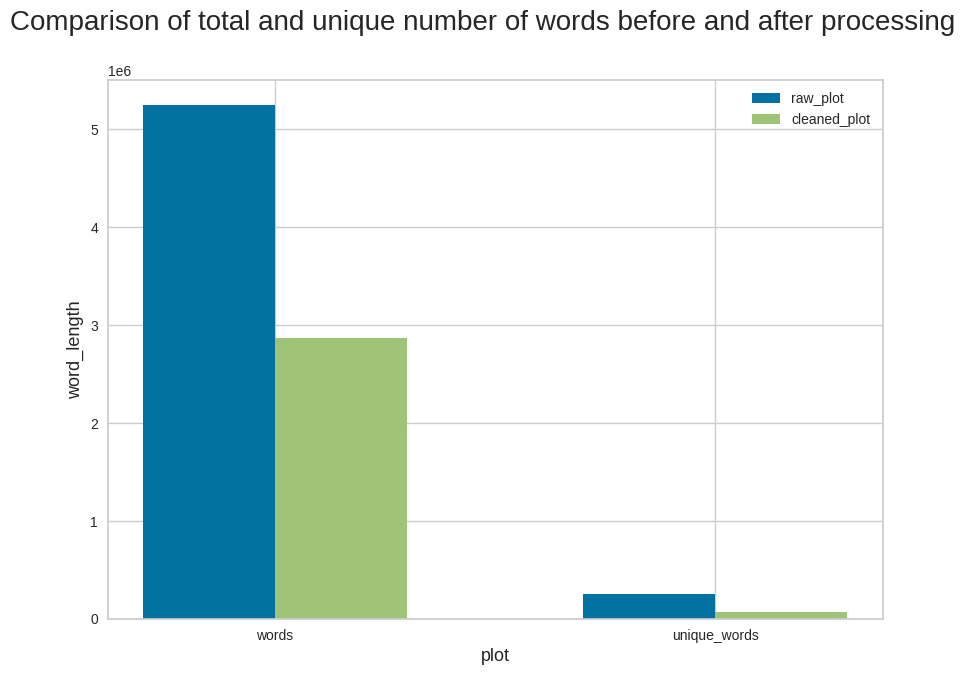

In [ ]:
plot_length = [[raw_length, clean_length], [raw_unique_length, clean_unique_length]]
length_df = pd.DataFrame(plot_length, columns = ['num_of_words', 'num_of_unique_words'])
length_df['index'] = ['raw_plot', 'cleaned_plot']

y1 = length_df['num_of_words']
y2 = length_df['num_of_unique_words']

plt.figure(figsize=(10,7))
ind = np.arange(2)

width = 0.3

# Plotting
plt.bar(ind, y1, width, label='raw_plot')
plt.bar(ind + width, y2, width, label='cleaned_plot')

plt.xlabel('plot', size = 13)
plt.ylabel('word_length', size = 13)
plt.suptitle('Comparison of total and unique number of words before and after processing', size = 20)
plt.xticks(ind + width / 2, ('words', 'unique_words'))
plt.legend(loc='best')
plt.show()

In [ ]:
length_df

,num_of_words,num_of_unique_words,index
0,5240143,2866481,raw_plot
1,253147,70730,cleaned_plot


### Distribución de palabras en la trama y el título de la película para cada género



DRAMA

Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en drama

Podemos ver en el gráfico que las palabras más comunes tienen que ver con familia, vida, amor, etc.

In [ ]:
import itertools
from sklearn.feature_extraction.text import CountVectorizer
from yellowbrick.text import FreqDistVisualizer

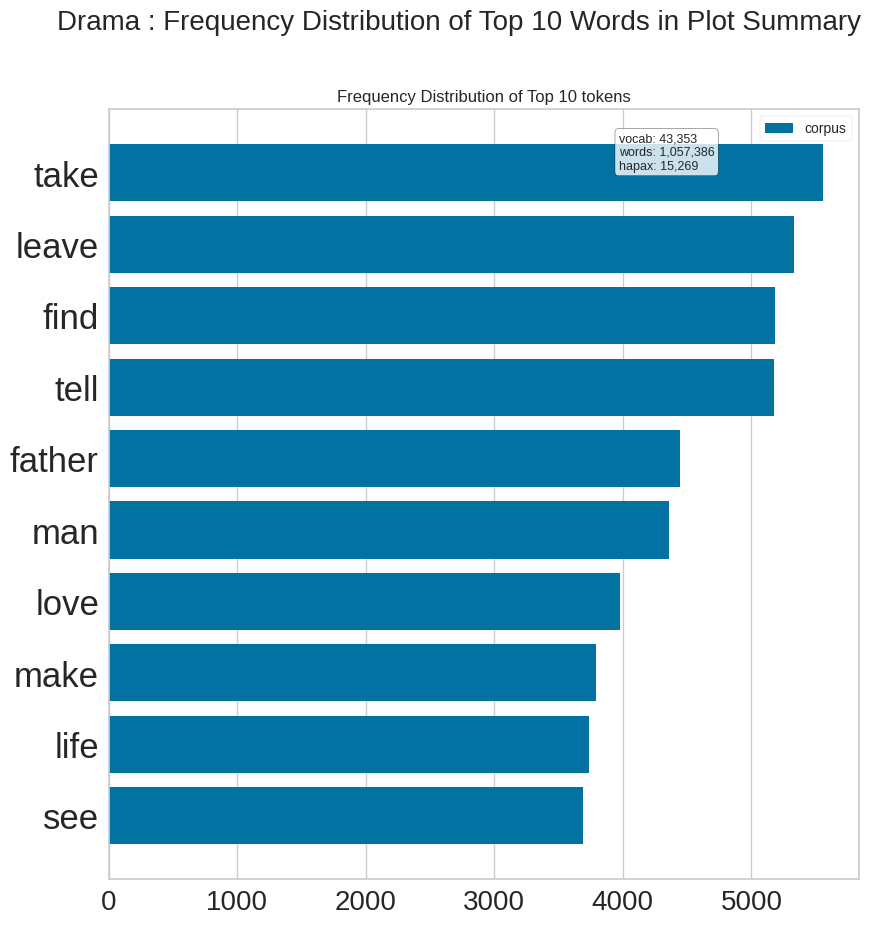

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
drama_plot = new_df.loc[new_df['labels'] == 1, ['Plot']]
drama_plotlist = [x for x in drama_plot['Plot'].str.split()]
drama_plotlist = list(itertools.chain(*drama_plotlist))

count = CountVectorizer()
docs = count.fit_transform(drama_plotlist)
features = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Drama : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en drama

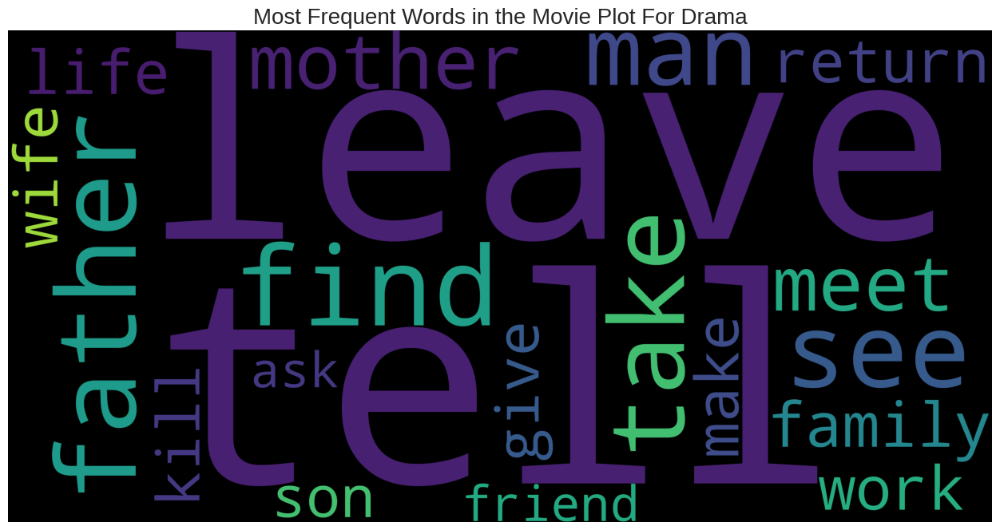

In [ ]:
from wordcloud import WordCloud, STOPWORDS

plot_corpus = ' '.join(drama_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words = 20, height=2000, width=4000, random_state = 42, normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Drama', fontsize = 20)
plt.show()

COMEDY

Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en comedia

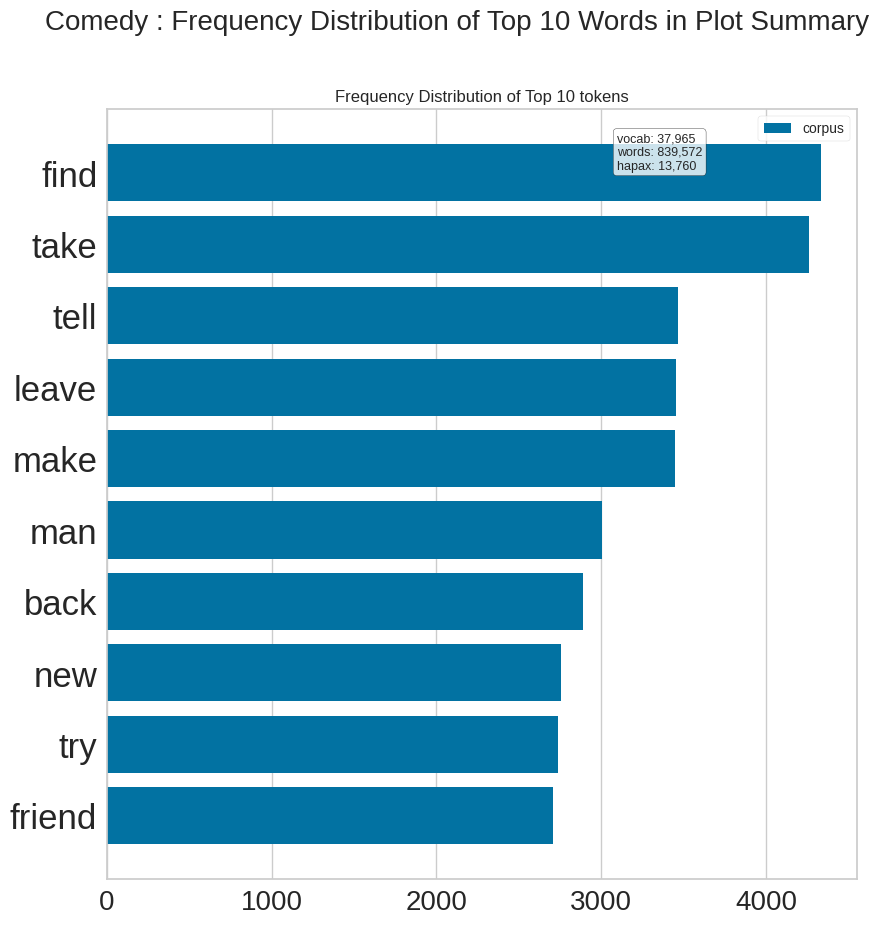

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
comedy_plot = new_df.loc[new_df['labels'] == 2, ['Plot']]
comedy_plotlist = [x for x in comedy_plot['Plot'].str.split()]
comedy_plotlist = list(itertools.chain(*comedy_plotlist))


count = CountVectorizer()
docs       = count.fit_transform(comedy_plotlist)
features   = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Comedy : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en comedy

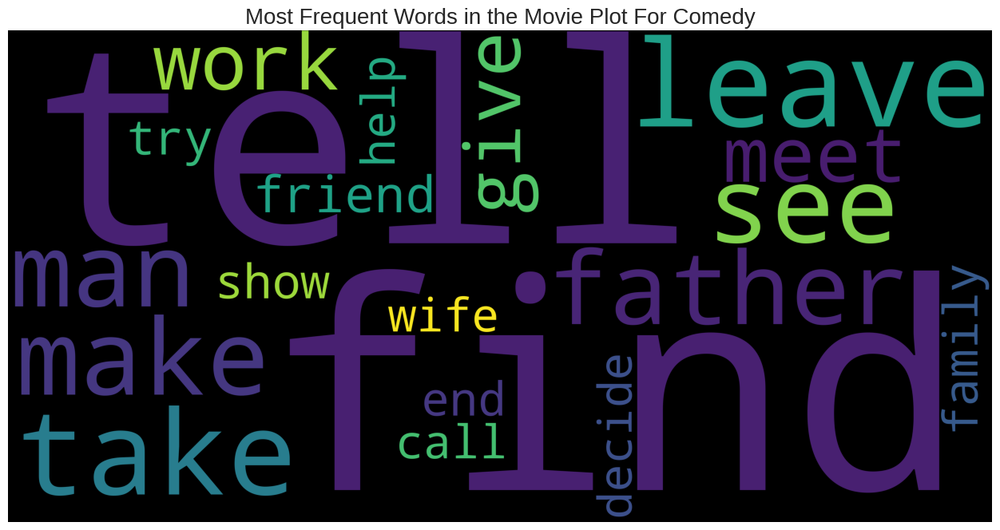

In [ ]:
plot_corpus = ' '.join(comedy_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words = 20, height=2000, width=4000, random_state = 42, normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Comedy', fontsize = 20)
plt.show()

HORROR


Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en horror. Palabras como matar, mortal y cuerpo parecen ser muy comunes.

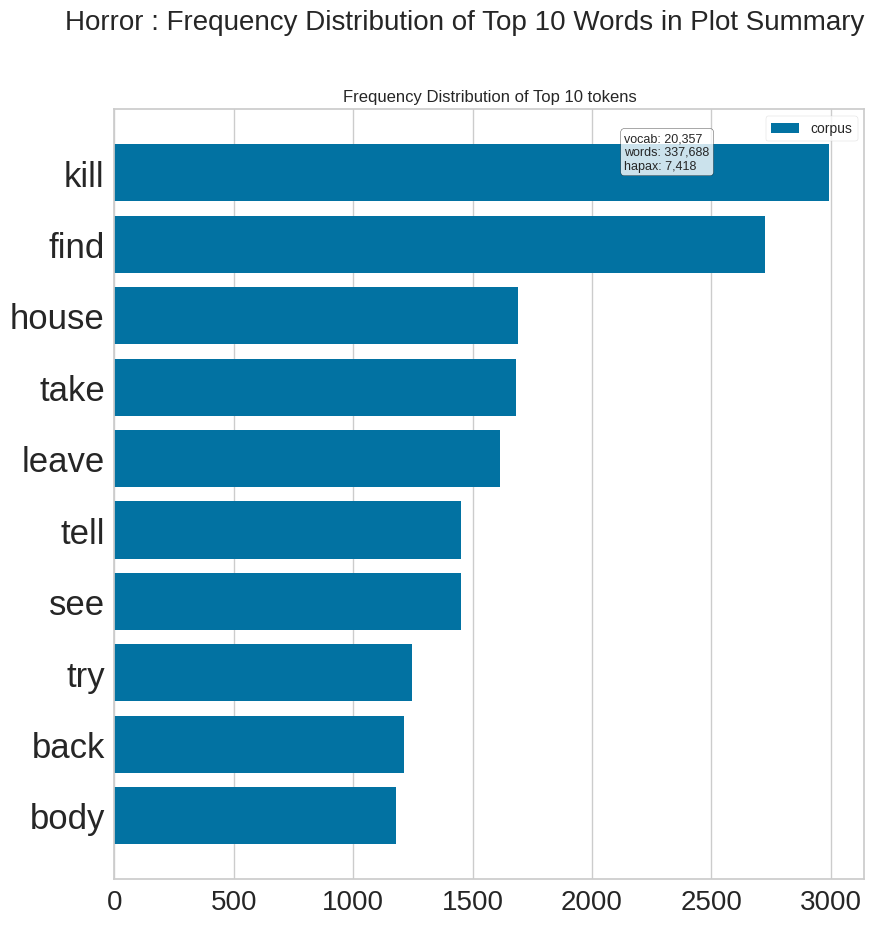

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
horror_plot = new_df.loc[new_df['labels'] == 3, ['Plot']]
horror_plotlist = [x for x in horror_plot['Plot'].str.split()]
horror_plotlist = list(itertools.chain(*horror_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(horror_plotlist)
features   = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Horror : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en  horror

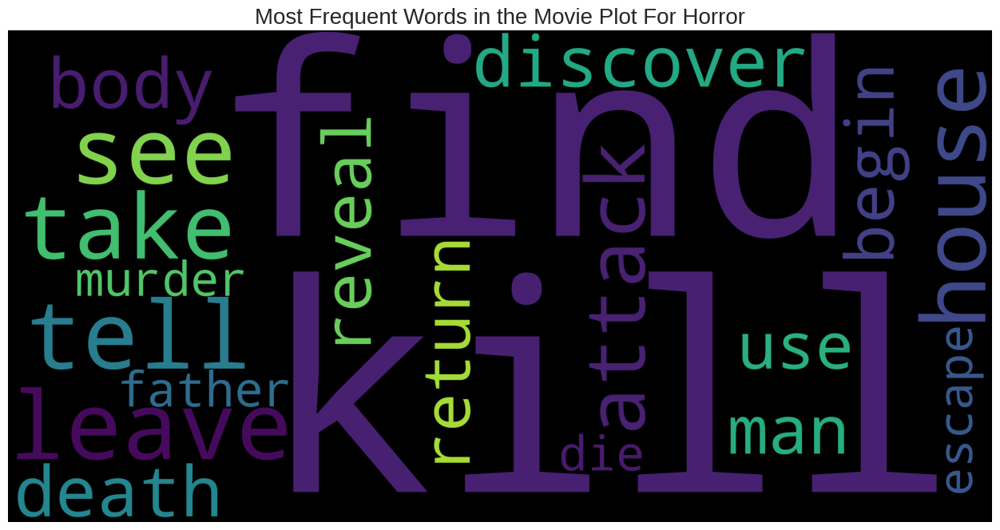

In [ ]:
plot_corpus = ' '.join(horror_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words=20, height=2000, width=4000, random_state = 42,
                           normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Horror', fontsize = 20)
plt.show()

ACTION

Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en acción.

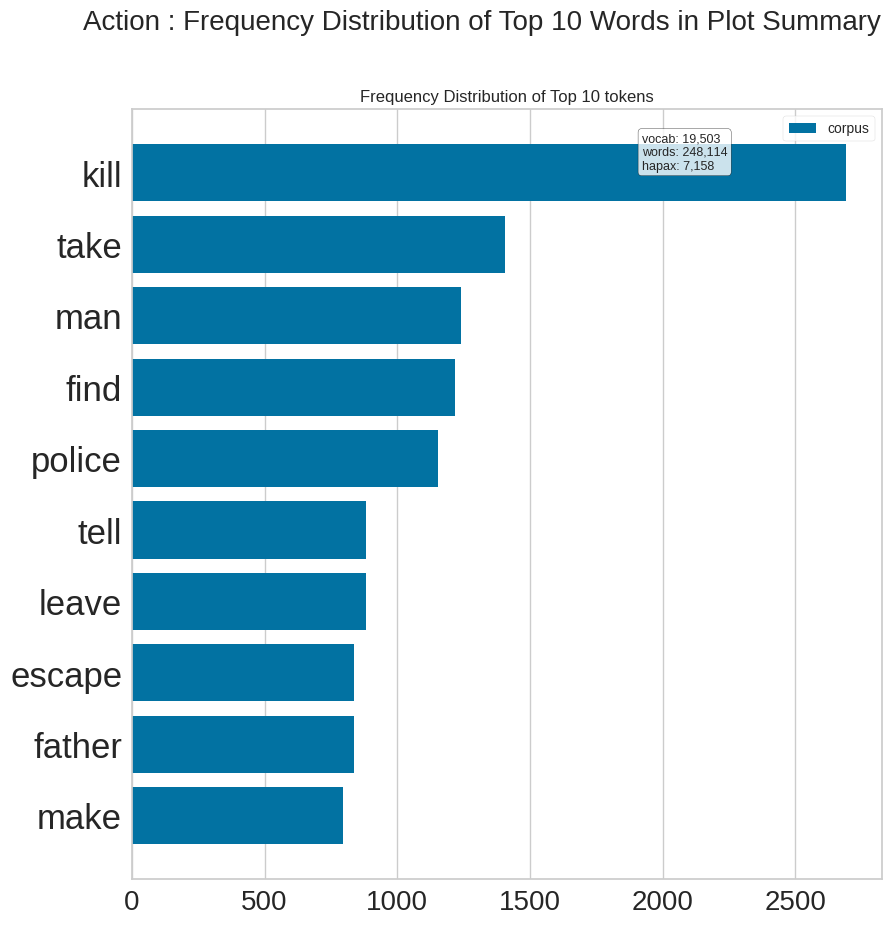

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
action_plot = new_df.loc[new_df['labels'] == 4, ['Plot']]
action_plotlist = [x for x in action_plot['Plot'].str.split()]
action_plotlist = list(itertools.chain(*action_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(action_plotlist)
features   = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Action : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en  action

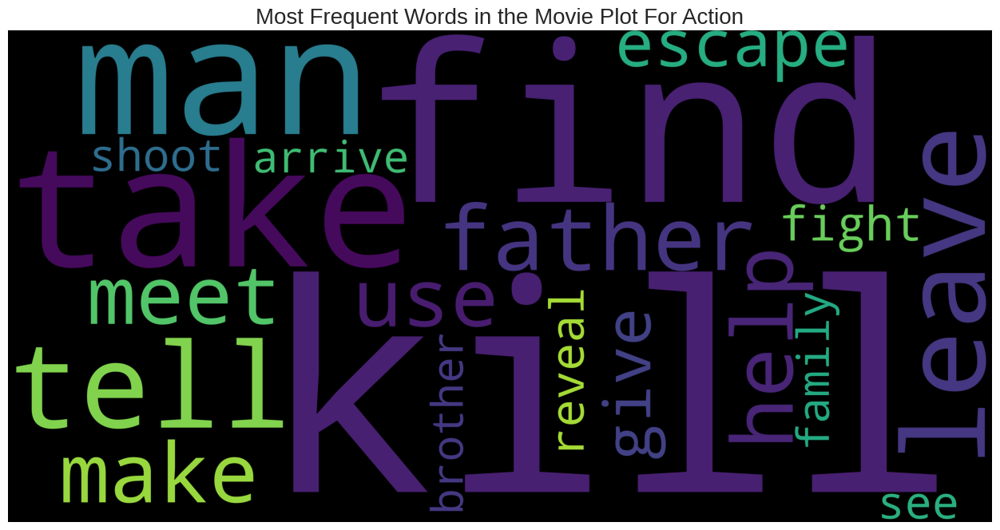

In [ ]:
plot_corpus = ' '.join(action_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words=20, height=2000, width=4000, random_state = 42, normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Action', fontsize = 20)
plt.show()

THRILLER

Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en thriller

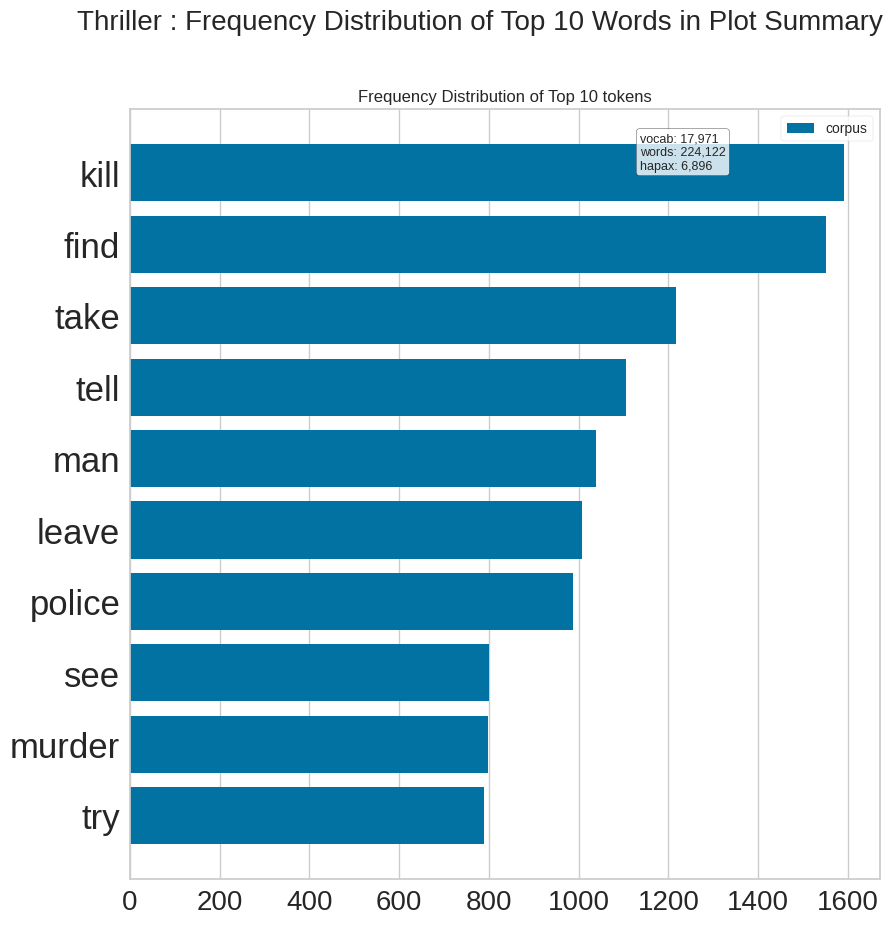

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
thriller_plot = new_df.loc[new_df['labels'] == 5, ['Plot']]
thriller_plotlist = [x for x in thriller_plot['Plot'].str.split()]
thriller_plotlist = list(itertools.chain(*thriller_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(thriller_plotlist)
features   = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Thriller : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en  thriller

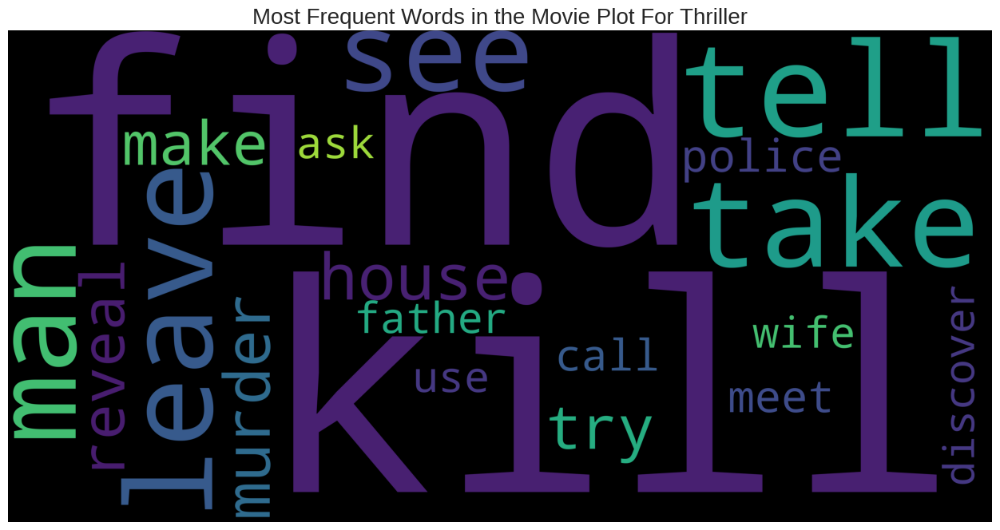

In [ ]:
plot_corpus = ' '.join(thriller_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words=20, height=2000, width=4000, random_state = 42,  normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Thriller', fontsize = 20)
plt.show()

ROMANCE

Gráfico de distribución de frecuencia mostrando las 20 palabras más comunes en los resúmenes de trama en romance

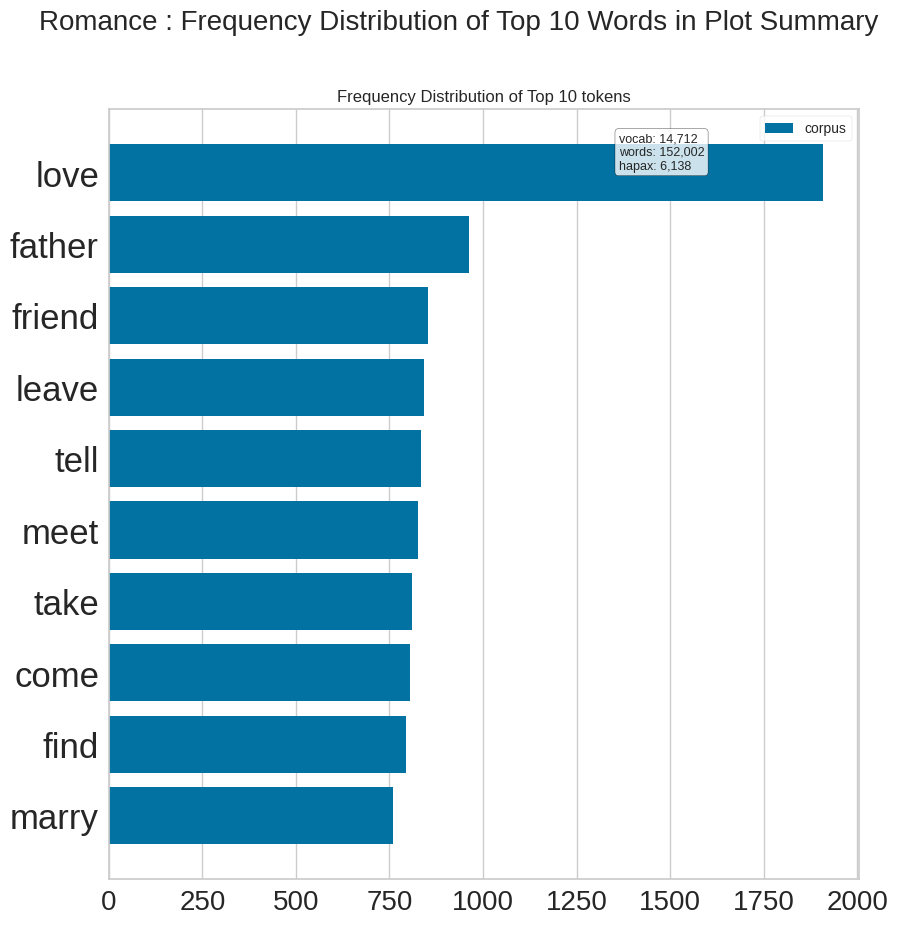

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [ ]:
romance_plot = new_df.loc[new_df['labels'] == 6, ['Plot']]
romance_plotlist = [x for x in romance_plot['Plot'].str.split()]
romance_plotlist = list(itertools.chain(*romance_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(romance_plotlist)
features   = count.get_feature_names_out()


fig = plt.figure(figsize=(10, 10))
plt.suptitle('Romance : Frequency Distribution of Top 10 Words in Plot Summary', size = 20)
plt.yticks(fontsize = 25)
plt.xticks(fontsize = 20)
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

La nube de palabras a continuación muestra las 20 palabras más frecuentes en  romance

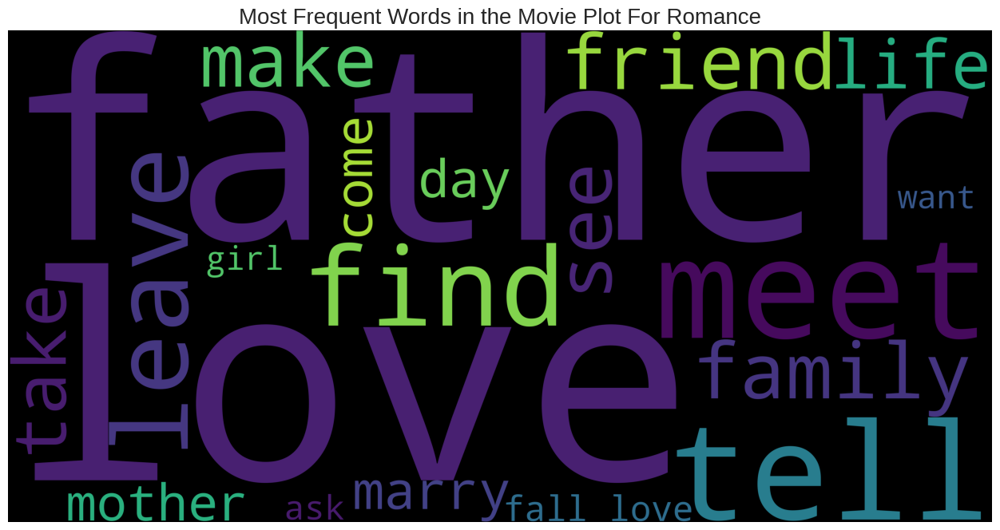

In [ ]:
plot_corpus = ' '.join(romance_plotlist)
plot_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', max_words=20, height=2000, width=4000, random_state = 42, normalize_plurals = False).generate(plot_corpus)

# Plot the wordcloud
fig, ax = plt.subplots(figsize=(16,8))
plt.imshow(plot_wordcloud)
plt.axis('off')
plt.title('Most Frequent Words in the Movie Plot For Romance', fontsize = 20)
plt.show()

# Modelado

### Asignando Variables Independientes y Objetivo y realizando la división en conjuntos de entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split
X = new_df['Plot']
y = new_df['labels']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state = 42, stratify = y)

# Restablecer los índices
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(10872,) (3625,) (10872,) (3625,)


# Tarea a realizar
Entrene 1 o 2 algoritmos de machine learning con las tramas de las películas. Para ello primero debe convertir los textos preprocesados a vectores de números. En el siguiente apartado se proponen diferentes técnicas. La idea es compararlas entre ellas. Entrene los algoritmos con esta nueva información y analice los resultados de la clasificación para ver si son mejores o no dependiendo de la técnica empleada. Comente brevemente las métricas empleadas para entender los resultados. Finalmente se propone que aplique las tñecnicas de explicabilidad LIME y SHAP sobre los textos. Se proporciona un ejemplo de código ya hecho el cual debe modificar para lo siguiente:

1. Seleccionar al menos una trama de cada uno de los géneros que tenemos en el dataset.

2. Aplicar LIME y SHAP.

3. Coentar y analizar los resultados en detalle.

4. Realice este proceso con las 4 técnicas de conversión de texto a vectores es decir con BoW, TF-IDF, W2V y BERT y el algoritmo entrenado en cada una de ellas.

## Preprocesamiento de la columna de trama para modelado

En este apartado se proprocionan diferentes métodos para extracción de características en texto. Se proponen 4 casos, uso de Bag Of Words, TF-IDF, Word2vec y BERT. Se proporciona ya el cñodigo para extraer los vectores de características. Puede modificar las dimensiones de estos para su análisis, por ejemplo en BoW y TF-IDF se limitan las palabras a que aparezcan al menos 100 veces para reducrie n gran medida el tamaño del vector final. En word2vec se propone un tamaño de Embedding de 128, pero puede modificarse. Finalmente para BERT se toma la media de los vectores de características de la red (existen otras opciones que puede consultar en la literatura).

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Instancia el vectorizador
count_vect = CountVectorizer(min_df=100)  # La palabra debe aparecer en al menos en 20 documentos

# Ajusta el vectorizador a los datos de entrenamiento
count_vect.fit(X_train)

# Transforma tanto el conjunto de entrenamiento como el de prueba
X_train_count = count_vect.transform(X_train)
X_test_count = count_vect.transform(X_test)


In [ ]:
# Now it's time for the NLP preprocessing
from sklearn.feature_extraction.text import TfidfVectorizer

# Instantiate the Vectorizer
# min_df at 20 - token should appear in at least 20 documents to be counted
tfidf = TfidfVectorizer(min_df=100) #, ngram_range=(1,3))

# Fit the vectorizer to the training data
tfidf.fit(X_train)

# Transform both train and test sets
X_train_tfidf = tfidf.transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

In [ ]:
from gensim.models import Word2Vec

# Preprocesar tus textos para obtener una lista de palabras
texts = [text.split() for text in X_train]

# Entrenar un modelo Word2Vec
word2vec = Word2Vec(sentences=texts, vector_size=128, window=5, min_count=1, workers=4)

# Función para vectorizar un texto basado en el modelo Word2Vec
def vectorize_text(text, model):
    vector = np.zeros(model.vector_size)
    num_words = 0
    for word in text.split():
        if word in model.wv:
            vector += model.wv[word]
            num_words += 1
    if num_words > 0:
        vector /= num_words
    return vector

# Vectorizar los conjuntos de entrenamiento y prueba
X_train_w2v = np.array([vectorize_text(text, word2vec) for text in X_train])
X_test_w2v = np.array([vectorize_text(text, word2vec) for text in X_test])

In [ ]:
from transformers import BertModel, BertTokenizer
import torch

# Cargar el modelo preentrenado y el tokenizador
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Verifica si CUDA está disponible
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA disponible. Usando GPU.")
else:
    device = torch.device("cpu")
    print("CUDA no disponible. Usando CPU.")

# Mover el modelo a la GPU si está disponible
model.to(device)

# Función para vectorizar texto usando BERT adaptada para CUDA
def vectorize_text_bert_cuda(text, tokenizer, model, device):
    inputs = tokenizer(text, return_tensors="pt", max_length=512, truncation=True, padding=True).to(device)
    outputs = model(**inputs)
    # Mueve el resultado de vuelta a la CPU para operaciones fuera de la GPU
    return outputs.last_hidden_state.mean(dim=1).detach().cpu().squeeze(0).numpy()

# Vectorizar los conjuntos de entrenamiento y prueba usando CUDA
X_train_bert = np.array([vectorize_text_bert_cuda(text, tokenizer, model, device) for text in X_train])
X_test_bert = np.array([vectorize_text_bert_cuda(text, tokenizer, model, device) for text in X_test])

CUDA disponible. Usando GPU.


### Entrenar un modelo en los vectores de características extraídos.

Se proporciona aquí un ejemplo de entrenamiento de una regresión logística y un Random Forest para clasificación de los géneros. Puede replicar este código con los algoritmos que desee para clasificación con los 4 casos de estudio de vectores extraídos BoW, TF-IDF, W2V y BERT. Entrene sus algoritmos (mínimo 4 uno por tipo de vector, puede ser el mismo algoritmo con todos) y comente los resultados. Analice si aglunos vectores son mejores que otros a la hora de la clasificación y se obtienen mejores o peores resultados en consecuencia. Comente todos los resultados y todo lo que observe.

Nota***: Si emplea XGBOOST de la librería que se debe instalar puede haber incompatibilidades a la hora de usar LIME con el código proporcionado y se deben adaptar ciertas partes para trabajar con el adecuadamente.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report

In [ ]:
# Desarrolle aquí todo el código de entrenamiento de sus modelos de clasificación con los diferentes tipos de vectores

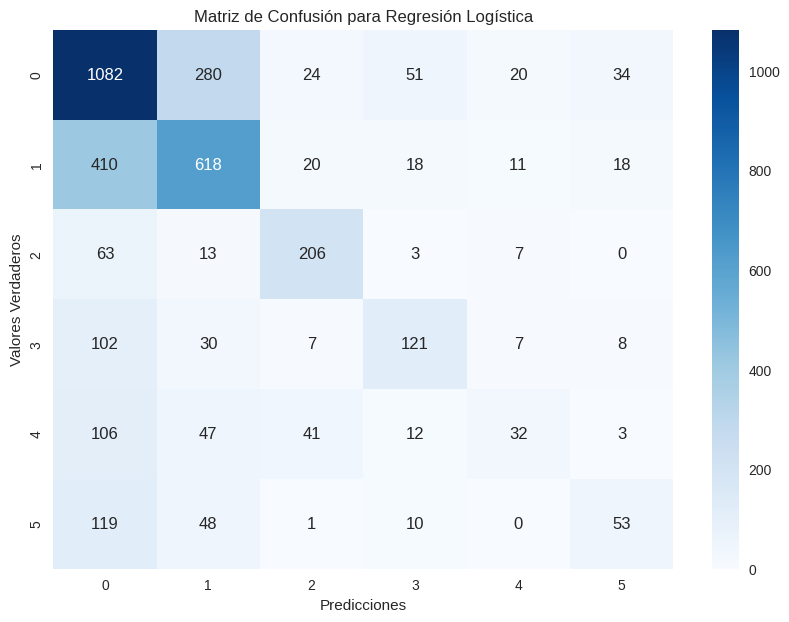

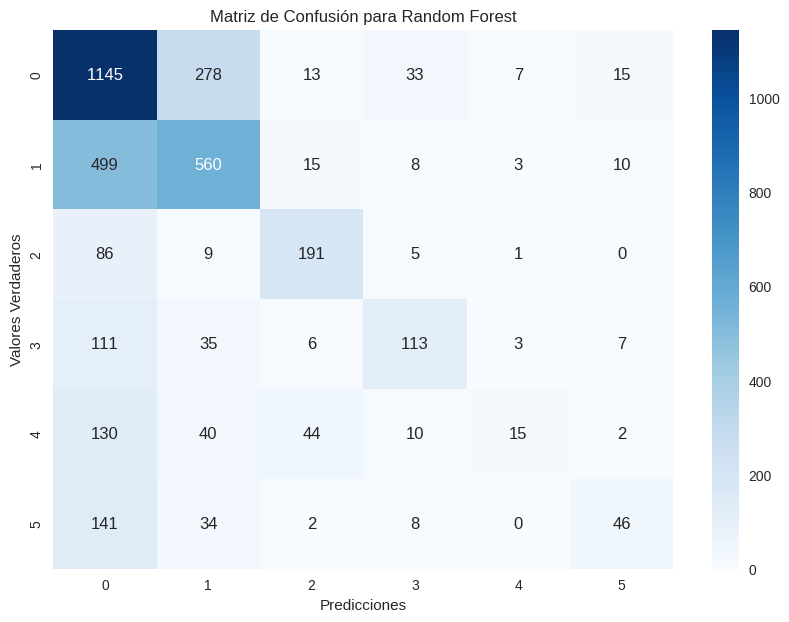

Reporte de Clasificación para Regresión Logística:
               precision    recall  f1-score   support

           1       0.57      0.73      0.64      1491
           2       0.60      0.56      0.58      1095
           3       0.69      0.71      0.70       292
           4       0.56      0.44      0.49       275
           5       0.42      0.13      0.20       241
           6       0.46      0.23      0.31       231

    accuracy                           0.58      3625
   macro avg       0.55      0.47      0.49      3625
weighted avg       0.57      0.58      0.57      3625

Reporte de Clasificación para Random Forest:
               precision    recall  f1-score   support

           1       0.54      0.77      0.64      1491
           2       0.59      0.51      0.55      1095
           3       0.70      0.65      0.68       292
           4       0.64      0.41      0.50       275
           5       0.52      0.06      0.11       241
           6       0.57      0.20 

In [ ]:
# Regresión Logística para w2v
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_w2v, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_w2v)  # Predecir las etiquetas para el conjunto de prueba

# Random Forest para w2v
rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_w2v, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_w2v)  # Predecir las etiquetas para el conjunto de prueba

# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, predictions_lr)
conf_matrix_rf = confusion_matrix(y_test, predictions_rf)

# Para la Regresión Logística
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_lr, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Regresión Logística')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para Random Forest
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_rf, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Random Forest')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para la Regresión Logística
report_lr = classification_report(y_test, predictions_lr)
print("Reporte de Clasificación para Regresión Logística:\n", report_lr)

# Para Random Forest
report_rf = classification_report(y_test, predictions_rf)
print("Reporte de Clasificación para Random Forest:\n", report_rf)

En primer lugar utilizamos W2V. Vemos que tanto para regresión logística, como para random forest obtenemos valores similares. El accuracy no es especialmente alto para ninguno de los dos modelos pero son valores aceptables.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


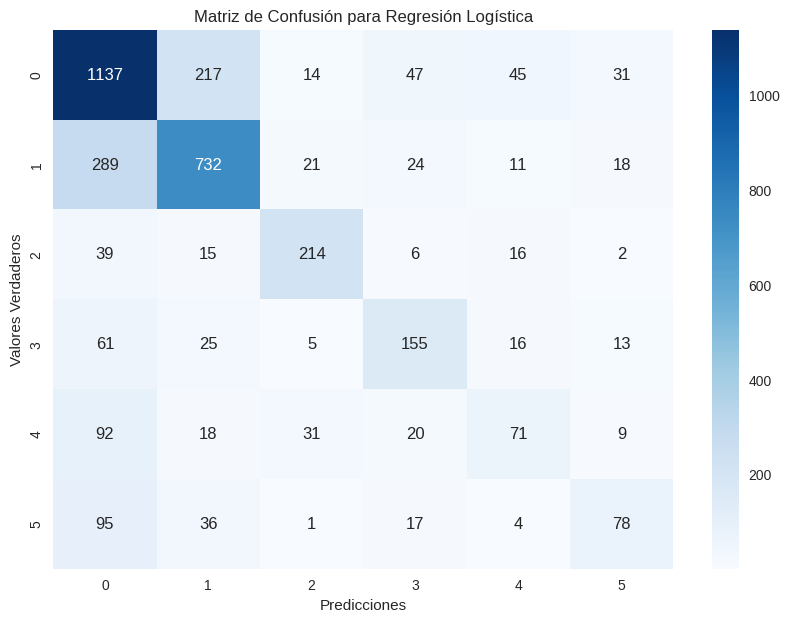

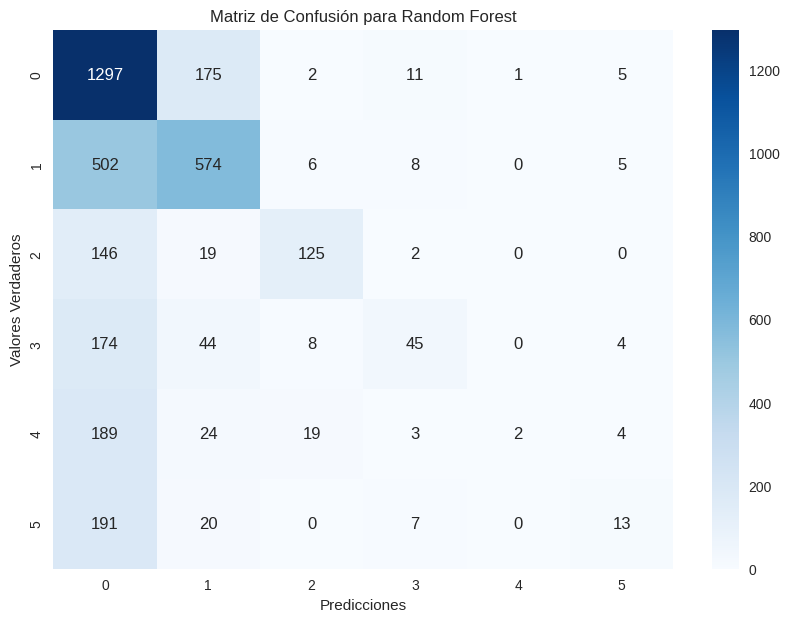

Reporte de Clasificación para Regresión Logística:
               precision    recall  f1-score   support

           1       0.66      0.76      0.71      1491
           2       0.70      0.67      0.68      1095
           3       0.75      0.73      0.74       292
           4       0.58      0.56      0.57       275
           5       0.44      0.29      0.35       241
           6       0.52      0.34      0.41       231

    accuracy                           0.66      3625
   macro avg       0.61      0.56      0.58      3625
weighted avg       0.65      0.66      0.65      3625

Reporte de Clasificación para Random Forest:
               precision    recall  f1-score   support

           1       0.52      0.87      0.65      1491
           2       0.67      0.52      0.59      1095
           3       0.78      0.43      0.55       292
           4       0.59      0.16      0.26       275
           5       0.67      0.01      0.02       241
           6       0.42      0.06 

In [ ]:
# Regresión Logística para bert
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_bert, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_bert)  # Predecir las etiquetas para el conjunto de prueba

# Random Forest para bert
rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_bert, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_bert)  # Predecir las etiquetas para el conjunto de prueba

# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, predictions_lr)
conf_matrix_rf = confusion_matrix(y_test, predictions_rf)

# Para la Regresión Logística
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_lr, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Regresión Logística')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para Random Forest
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_rf, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Random Forest')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para la Regresión Logística
report_lr = classification_report(y_test, predictions_lr)
print("Reporte de Clasificación para Regresión Logística:\n", report_lr)

# Para Random Forest
report_rf = classification_report(y_test, predictions_rf)
print("Reporte de Clasificación para Random Forest:\n", report_rf)

Para BERT obtenemos mejores resultados con regresión logística. De hecho, si lo comparamos con W2V, el accuracy está considerablemente por encima. Sin embargo, para random forest obtenemos valores similares que con el otro tipo de vector.

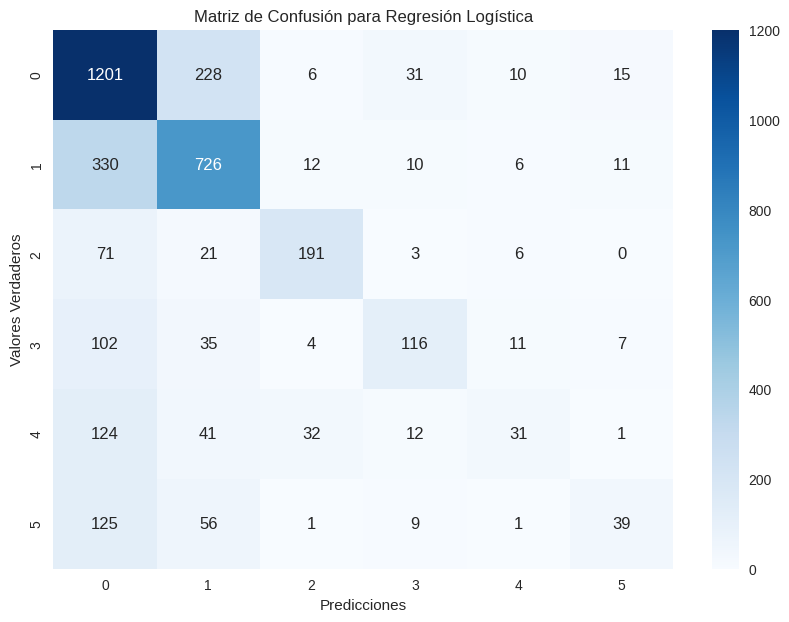

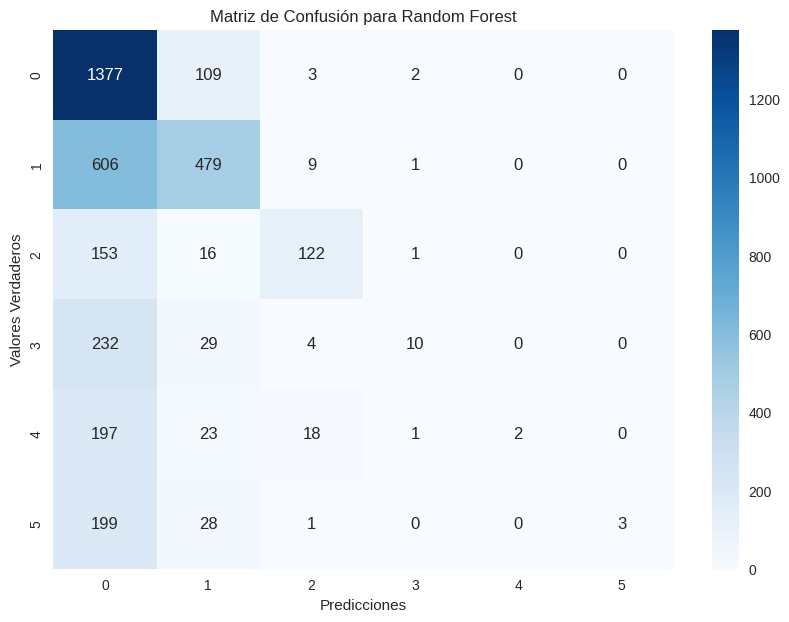

Reporte de Clasificación para Regresión Logística:
               precision    recall  f1-score   support

           1       0.61      0.81      0.70      1491
           2       0.66      0.66      0.66      1095
           3       0.78      0.65      0.71       292
           4       0.64      0.42      0.51       275
           5       0.48      0.13      0.20       241
           6       0.53      0.17      0.26       231

    accuracy                           0.64      3625
   macro avg       0.62      0.47      0.51      3625
weighted avg       0.63      0.64      0.61      3625

Reporte de Clasificación para Random Forest:
               precision    recall  f1-score   support

           1       0.50      0.92      0.65      1491
           2       0.70      0.44      0.54      1095
           3       0.78      0.42      0.54       292
           4       0.67      0.04      0.07       275
           5       1.00      0.01      0.02       241
           6       1.00      0.01 

In [ ]:
# Regresión Logística para tfidf
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_tfidf, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_tfidf)  # Predecir las etiquetas para el conjunto de prueba

# Random Forest para tfidf
rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_tfidf, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_tfidf)  # Predecir las etiquetas para el conjunto de prueba

# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, predictions_lr)
conf_matrix_rf = confusion_matrix(y_test, predictions_rf)

# Para la Regresión Logística
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_lr, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Regresión Logística')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para Random Forest
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_rf, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Random Forest')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para la Regresión Logística
report_lr = classification_report(y_test, predictions_lr)
print("Reporte de Clasificación para Regresión Logística:\n", report_lr)

# Para Random Forest
report_rf = classification_report(y_test, predictions_rf)
print("Reporte de Clasificación para Random Forest:\n", report_rf)

En cuanto a TF-IDF el comportamiento de ambos modelos es similar al que tienen con BERT. Resultados bastante parecidos aunque algo peores para el tipo de vector TF-IDF.

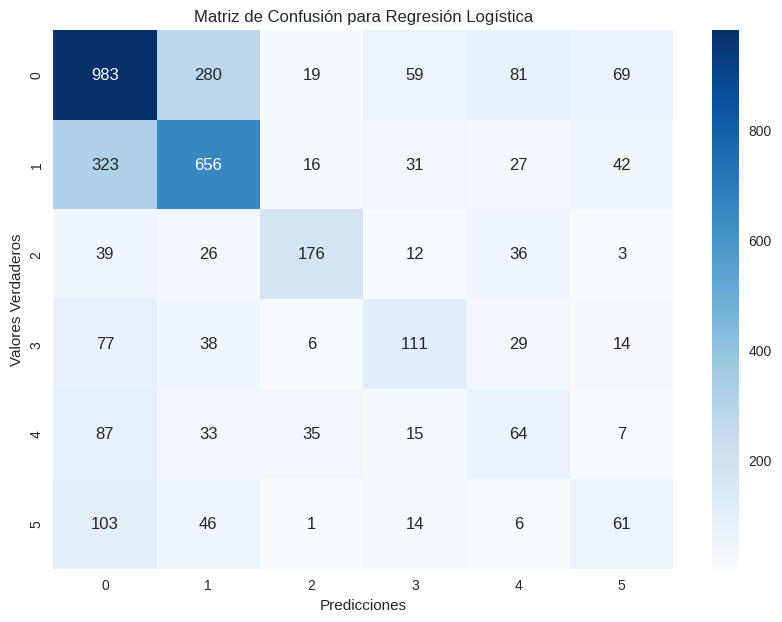

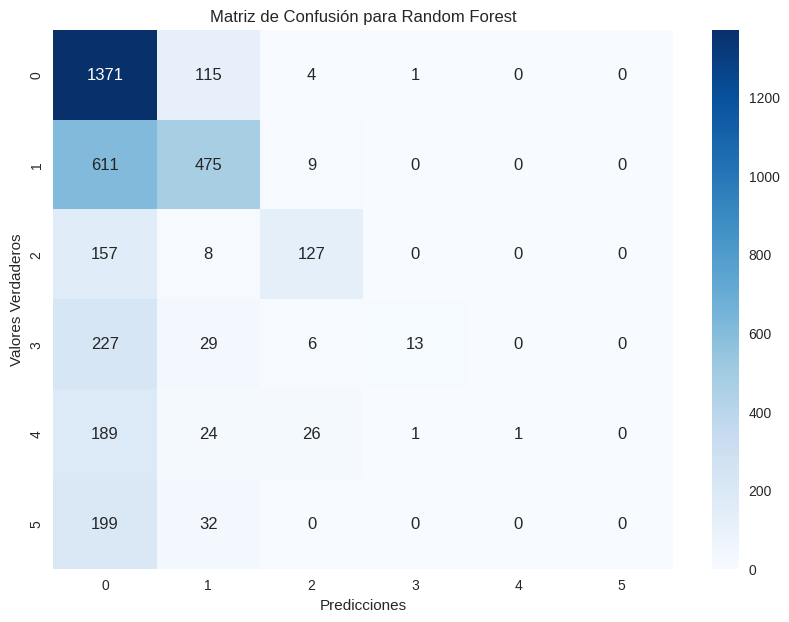

Reporte de Clasificación para Regresión Logística:
               precision    recall  f1-score   support

           1       0.61      0.66      0.63      1491
           2       0.61      0.60      0.60      1095
           3       0.70      0.60      0.65       292
           4       0.46      0.40      0.43       275
           5       0.26      0.27      0.26       241
           6       0.31      0.26      0.29       231

    accuracy                           0.57      3625
   macro avg       0.49      0.47      0.48      3625
weighted avg       0.56      0.57      0.56      3625

Reporte de Clasificación para Random Forest:
               precision    recall  f1-score   support

           1       0.50      0.92      0.65      1491
           2       0.70      0.43      0.53      1095
           3       0.74      0.43      0.55       292
           4       0.87      0.05      0.09       275
           5       1.00      0.00      0.01       241
           6       0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Regresión Logística para BoW
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_count, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_count)  # Predecir las etiquetas para el conjunto de prueba

# Random Forest para BoW
rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_count, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_count)  # Predecir las etiquetas para el conjunto de prueba

# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, predictions_lr)
conf_matrix_rf = confusion_matrix(y_test, predictions_rf)

# Para la Regresión Logística
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_lr, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Regresión Logística')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para Random Forest
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_rf, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión para Random Forest')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()

# Para la Regresión Logística
report_lr = classification_report(y_test, predictions_lr)
print("Reporte de Clasificación para Regresión Logística:\n", report_lr)

# Para Random Forest
report_rf = classification_report(y_test, predictions_rf)
print("Reporte de Clasificación para Random Forest:\n", report_rf)




Por último, para el tipo de vector BoW tenemos unos resultados similares a los obtenidos con W2V. Ambos modelos tienen un accuracy aceptable pero ninguno es destacablemente alto.

# Explicabilidad de los modelos con entrada de texto mediante LIME

Se va a realizar ahora una explicación de los modelos para intentar entender que está pasando en ellos. Por ello se empleará LIME en su versión para ser usada con texto. Se proporcionan dos ejemplos con LIME, para BoW y TFIDF, y el otro para Word2Vec y se debe adaptar para BERT. La idea general es la que se comentaba al inicio, seleccionar una trama de cada género y ver que sucede con las explicaciones. Comente y detalle todo lo que observe de sus resultados. Repita el proceso con cada tipo de vectores de características para ver si algunos vectores son más potentes en términos de la representación final de la información. La idea fundamental es observar que palabras aparecen principlamente remarcadas en las explicaciones con diferentes entradas de datos y comprobar si tiene sentido y sacar conclusiones en base a ello.

Nota***: Tenga en cuanta que en el siguiente código la línea:

- c = make_pipeline(method, model)

Sólo funcionará para los casos con Count_vectorizer y TF-IDF que cumplen las condiciones para ello. Para los casos de Word2Vec y BERT se deben crear funciones adicionales especiales. Se proporciona el ejemplo para Word2Vec comentado. Para BERT debe buscar como adaptar el código para su funcionamiento.

### LIME

In [ ]:
import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

In [ ]:
c = make_pipeline(count_vect, lr)
class_names=["drama", "comedy", "horror", "action", "thriller", "romance"]
explainer = LimeTextExplainer(class_names=class_names)

idx = 0
exp = explainer.explain_instance(X_test[idx], c.predict_proba, num_features=6, labels=[0, 1, 2, 3, 4, 5])

In [ ]:
converted_data = count_vect.transform([X_test[idx]])
print('Document id: %d' % idx)
print('Predicted class =', class_names[lr.predict(converted_data).reshape(1,-1)[0,0]])
print('True class: %s' % class_names[y_test[idx]])

Document id: 0
Predicted class = comedy
True class: comedy


In [ ]:
print ('Explanation for class %s' % class_names[0])
print ('\n'.join(map(str, exp.as_list(label=0))))

Explanation for class drama
('tragedy', 0.32038412506695885)
('fashion', 0.14343431591949388)
('suit', 0.13867363315811934)
('rid', -0.13641581554123614)
('adult', -0.12864439165685557)
('wear', 0.11637362370975665)


In [ ]:
exp = explainer.explain_instance(X_test[idx], c.predict_proba, num_features=6, top_labels=2)
print(exp.available_labels())

[0, 1]


In [ ]:
exp.show_in_notebook(text=False)

In [ ]:
exp.show_in_notebook(text=y_test[idx], labels=(0,))

In [ ]:
# Desarrolle aquí todo el código comentado y añada tantas celdas de texto con explicaciones como considere oportunas

In [ ]:
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_w2v, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_w2v)

# Ejemplo con word2vec (debe adaptar los modelos a usar y entrenarlos en estos vectores)
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando la función vectorize_text
    text_vectors = np.array([vectorize_text(text, word2vec) for text in texts])
    return lr.predict_proba(text_vectors) # modifique el modelo empleado

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Asegúrate de que class_names esté definido

# Explique la instancia de prueba
idx = 3  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)

In [ ]:
lr = LogisticRegression(max_iter=1000, solver='lbfgs')
lr.fit(X_train_bert, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_lr = lr.predict(X_test_bert)

# Ejemplo con BERT
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando la función vectorize_text_bert_cuda
    text_vectors = np.array([vectorize_text_bert_cuda(text, tokenizer, model, device) for text in texts])
    return lr.predict_proba(text_vectors)

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Asegúrate de que class_names esté definido

# Explique la instancia de prueba
idx = 3  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_count, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_count)

# Ejemplo con BoW y Random Forest
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando el CountVectorizer
    text_vectors = count_vect.transform(texts)
    return rf.predict_proba(text_vectors)

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

# Explique la instancia de prueba
idx = 2  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_tfidf, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_tfidf)

# Ejemplo con TF-IDF y Random Forest
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando el TF-IDF Vectorizer
    text_vectors = tfidf.transform(texts)
    return rf.predict_proba(text_vectors)

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

# Explique la instancia de prueba
idx = 1  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_w2v, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_w2v)

# Ejemplo con Word2Vec y Random Forest
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando la función vectorize_text
    text_vectors = np.array([vectorize_text(text, word2vec) for text in texts])
    return rf.predict_proba(text_vectors)

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

# Explique la instancia de prueba
idx = 4  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=30, min_samples_split=20, min_samples_leaf=5)
rf.fit(X_train_bert, y_train)  # Ajustar el modelo a los datos de entrenamiento
predictions_rf = rf.predict(X_test_bert)

# Ejemplo con BERT y Random Forest
def predict_proba_func(texts):
    # Transformar cada texto a un vector usando BERT
    text_vectors = np.array([vectorize_text_bert_cuda(text, tokenizer, model, device) for text in texts])
    return rf.predict_proba(text_vectors)

from lime.lime_text import LimeTextExplainer

# Crear una instancia de LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

# Explique la instancia de prueba
idx = 0  # O cualquier otro índice de prueba
exp = explainer.explain_instance(X_test[idx], predict_proba_func, num_features=6)

# Mostrar la explicación
exp.show_in_notebook(text=True)


Hemos usado tanto Logistic Regression como Random Forest para aplicar LIME y observar los resultados. Podemos ver que la mayoría de películas las clasifica como drama y normalmente clasifica de forma aceptable las palabras clave. Hemos ido probando distintos índices y viendo diferentes resultados. También podemos ver que el género comedia suele tener siempre una probabilidad considerable, esto puede deberse a que asigna muchas palabras a este género, las cuales no siempre cuadran demasiado bien con él.